In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [11]:
cd /content/gdrive/My Drive/data_visualization/datavis_data

/content/gdrive/My Drive/data_visualization/datavis_data


In [ ]:
#!git clone https://github.com/fizyr/keras-retinanet.git

Cloning into 'keras-retinanet'...
remote: Enumerating objects: 6224, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 6224 (delta 6), reused 6 (delta 2), pack-reused 6205
Receiving objects: 100% (6224/6224), 13.48 MiB | 11.97 MiB/s, done.
Resolving deltas: 100% (4207/4207), done.


In [13]:
!python setup.py build_ext --inplace

/usr/local/lib/python3.9/dist-packages/setuptools/__init__.py:85: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated. Requirements should be satisfied by a PEP 517 installer. If you are using pip, you can try `pip install --use-pep517`.
  dist.fetch_build_eggs(dist.setup_requires)
running build_ext
skipping 'keras_retinanet/utils/compute_overlap.c' Cython extension (up-to-date)


In [ ]:
!pip install gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [8]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import train_test_split
import urllib
import os
import csv
import cv2
import time
from PIL import Image

from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

In [21]:
classes = dict()
classes["class_name"] = ["ignore","pedestrian","people","bicycle","car","van","truck","tricycle","awning-tricycle","bus","motor","others"]
classes["id"] = [0,1,2,3,4,5,6,7,8,9,10,11]

cl = pd.DataFrame(classes)

cl.head()

,class_name,id
0,ignore,0
1,pedestrian,1
2,people,2
3,bicycle,3
4,car,4


In [22]:
dataset = dict()
dataset["image_name"] = list()
dataset["x_min"] = list()
dataset["y_min"] = list()
dataset["x_max"] = list()
dataset["y_max"] = list()
dataset["class_name"] = list()

an = "/content/gdrive/My Drive/data_visualization/datavis_data/annotation"
tn = "/content/gdrive/My Drive/data_visualization/datavis_data/train"

anDir = os.listdir(an)
p=[]

for i in anDir:
  ani = tn+"/"+i[0:len(i)-3]+"jpg"
  y = an+"/"+i

  f = open(y,"r")
  
  z = f.readlines()
  
  for k in range(len(z)):
    z[k]=z[k].rstrip()
    p = z[k].split(",")
    
    if int(p[5])!=0 and ani.find("(1).jpg")==-1 and (int(p[1])<(int(p[1])+int(p[3]))) and (int(p[0])<(int(p[0])+int(p[2]))):
      dataset["image_name"].append(ani)
      dataset["x_min"].append(int(p[0]))
      dataset["y_min"].append(int(p[1]))
      dataset["x_max"].append(int(p[0])+int(p[2]))
      dataset["y_max"].append(int(p[1])+int(p[3]))

      dataset["class_name"].append(classes['class_name'][int(p[5])])

  f.close()

In [37]:
df = pd.DataFrame(dataset)
df.head()

                                            image_name  x_min  y_min  x_max  \
300  /content/gdrive/My Drive/data_visualization/da...   1046    120   1099   
301  /content/gdrive/My Drive/data_visualization/da...    846    824    861   
302  /content/gdrive/My Drive/data_visualization/da...   1037    930   1056   
303  /content/gdrive/My Drive/data_visualization/da...   1026    916   1056   
304  /content/gdrive/My Drive/data_visualization/da...   1073    744   1201   
..                                                 ...    ...    ...    ...   
395  /content/gdrive/My Drive/data_visualization/da...    197    497    263   
396  /content/gdrive/My Drive/data_visualization/da...    170    439    221   
397  /content/gdrive/My Drive/data_visualization/da...    278    462    304   
398  /content/gdrive/My Drive/data_visualization/da...    491    441    541   
399  /content/gdrive/My Drive/data_visualization/da...    527    811    620   

     y_max  class_name  
300    201         car  
3

In [24]:
print(df.shape)

(344736, 6)


In [25]:
for i in df["image_name"]:
  x = i.find("(1).jpg")
  if x!=-1:  
    print(i)

# Preprocessing

In [26]:
train_df, test_df = train_test_split(
  df, 
  test_size=0.1, 
  random_state=RANDOM_SEED
)

In [ ]:
print(len(train_df))

310262


In [ ]:
ANNOTATIONS_FILE = 'annotations.csv'
CLASSES_FILE = 'classes.csv'

In [ ]:
train_df.to_csv(ANNOTATIONS_FILE, index=False, header=None)
cl.to_csv(CLASSES_FILE, index=False, header=None)

# Training

In [ ]:
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to ./snapshots/_pretrained_model.h5


In [ ]:
!chmod 755 keras_retinanet/bin/train.py

In [ ]:
!keras_retinanet/bin/train.py --freeze-backbone --random-transform --weights {PRETRAINED_MODEL} --batch-size 8 --steps 500 --epochs 5 csv annotations.csv classes.csv

2023-04-05 14:18:37.690715: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Creating model, this may take a second...
2023-04-05 14:48:53.713640: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
/usr/local/lib/python3.9/dist-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(
Model: "retinanet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1

# Loading the trained model

In [3]:
cd /content/gdrive/My Drive/data_visualization/datavis_data/keras-retinanet

/content/gdrive/My Drive/data_visualization/datavis_data/keras-retinanet


In [4]:
!ls snapshots

_pretrained_model.h5  resnet50_csv_02.h5  resnet50_csv_04.h5
resnet50_csv_01.h5    resnet50_csv_03.h5  resnet50_csv_05.h5


In [14]:
CLASSES_FILE = 'classes.csv'

model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])
print(model_path)

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

labels_to_names = pd.read_csv(CLASSES_FILE, header=None).T.loc[0].to_dict()

snapshots/resnet50_csv_05.h5


/usr/local/lib/python3.9/dist-packages/keras/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


# Predictions

In [15]:
def predict(image):
  image = preprocess_image(image.copy())
  image, scale = resize_image(image)

  boxes, scores, labels = model.predict_on_batch(
    np.expand_dims(image, axis=0)
  )

  boxes /= scale

  return boxes, scores, labels

In [16]:
THRES_SCORE = 0.6

def draw_detections(image, boxes, scores, labels):
  for box, score, label in zip(boxes[0], scores[0], labels[0]):
    if score < THRES_SCORE:
        break

    color = label_color(label)

    b = box.astype(int)
    draw_box(image, b, color=color)

    caption = "{} {:.3f}".format(labels_to_names[label], score)
    draw_caption(image, b, caption)


In [17]:
from PIL import Image

In [18]:
def show_detected_objects(image_row,dr):
  if dr==1: 
    img_path = image_row.image_name
  
    image = read_image_bgr(img_path)

    boxes, scores, labels = predict(image)

    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    true_box = [
      image_row.x_min, image_row.y_min, image_row.x_max, image_row.y_max
    ]
    draw_box(draw, true_box, color=(255, 255, 0))

    draw_detections(draw, boxes, scores, labels)

    plt.axis('off')
    plt.imshow(draw)
    plt.show()
  
  else:  
    image = read_image_bgr(image_row)

    boxes, scores, labels = predict(image)

    for i in range(len(boxes[0])):
      # Crop the image
      print(boxes[0][i])
      img = Image.open(image_row)

      roi = img.crop((int(boxes[0][i][0]),int(boxes[0][i][1]),int(boxes[0][i][2]),int(boxes[0][i][3])))

      # Save the cropped image
      y = "../final_output/"+classes['class_name'][labels[0][i]]
      name_length = len(os.listdir(y))+1
      z = "../final_output/"+classes['class_name'][labels[0][i]]+"/"+str(name_length)+".jpg"
      print(z)
      print(y)
      roi.save(z)

In [27]:
test_df.head(n=10)

,image_name,x_min,y_min,x_max,y_max,class_name
276203,/content/gdrive/My Drive/data_visualization/da...,792,52,828,66,car
53926,/content/gdrive/My Drive/data_visualization/da...,1105,446,1137,476,car
282144,/content/gdrive/My Drive/data_visualization/da...,1158,55,1194,69,car
296669,/content/gdrive/My Drive/data_visualization/da...,849,238,863,250,car
62472,/content/gdrive/My Drive/data_visualization/da...,1531,55,1585,87,van
208754,/content/gdrive/My Drive/data_visualization/da...,209,580,233,599,pedestrian
267468,/content/gdrive/My Drive/data_visualization/da...,290,531,300,541,people
284896,/content/gdrive/My Drive/data_visualization/da...,58,423,175,494,car
274077,/content/gdrive/My Drive/data_visualization/da...,889,319,897,328,people
48725,/content/gdrive/My Drive/data_visualization/da...,260,485,274,496,car


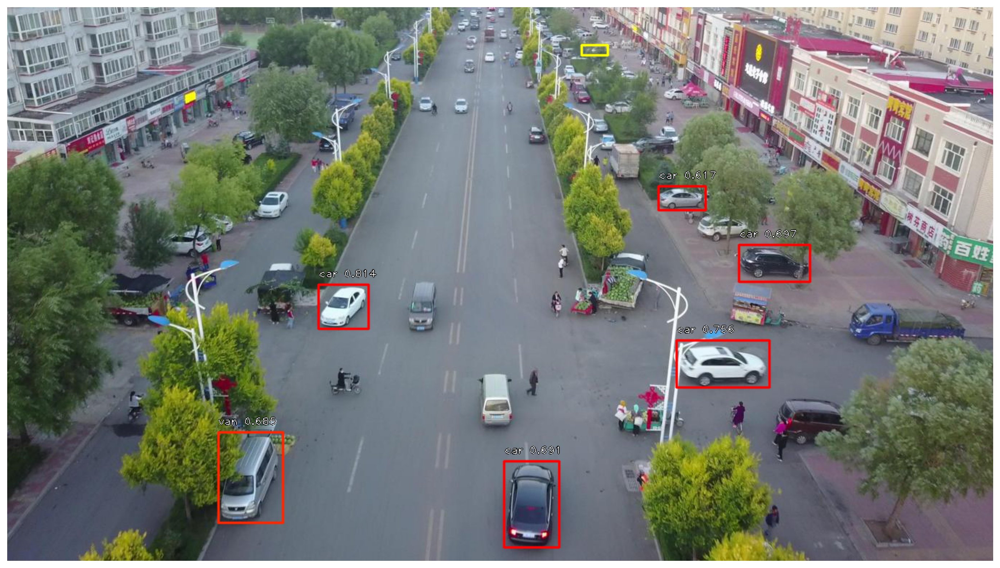

In [28]:
show_detected_objects(test_df.iloc[0],1)

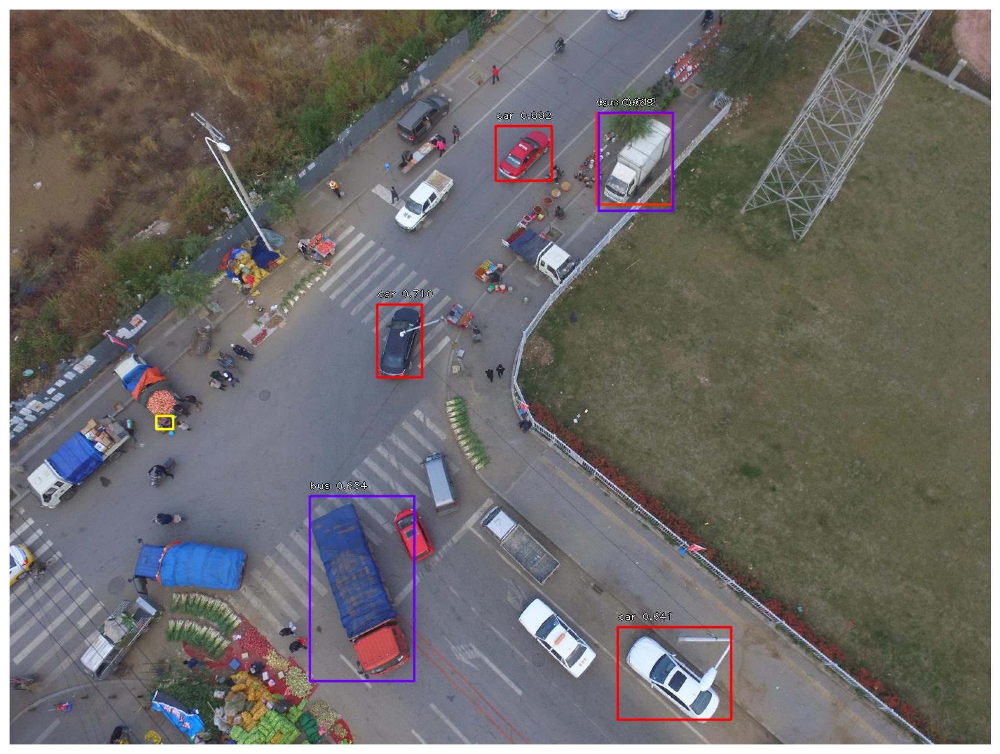

In [29]:
show_detected_objects(test_df.iloc[5],1)

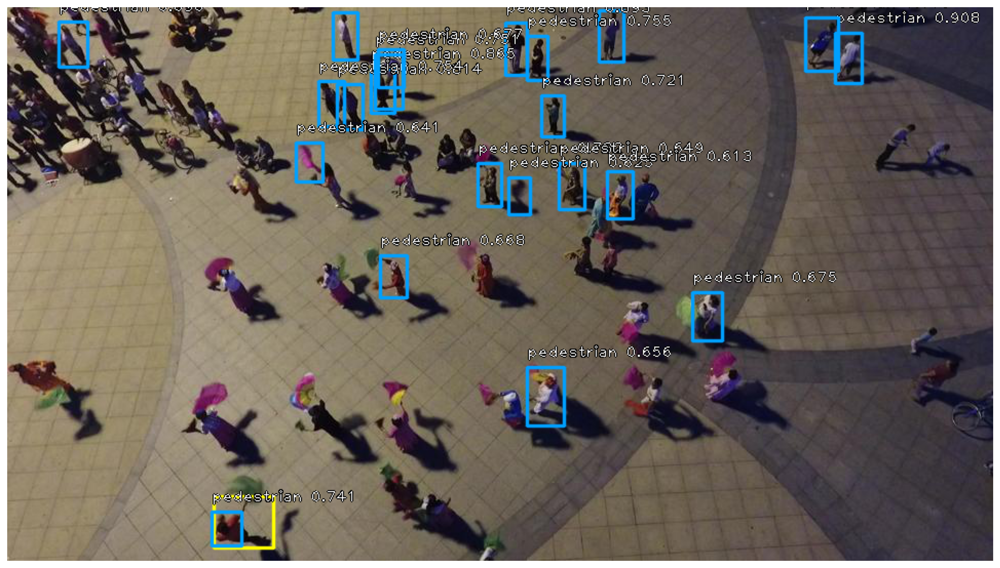

In [44]:
for i in range(df.shape[0]):
  if df.iloc[i,0].endswith("000031_03527_d_0000043.jpg"):
    show_detected_objects(df.iloc[i],1)
    break

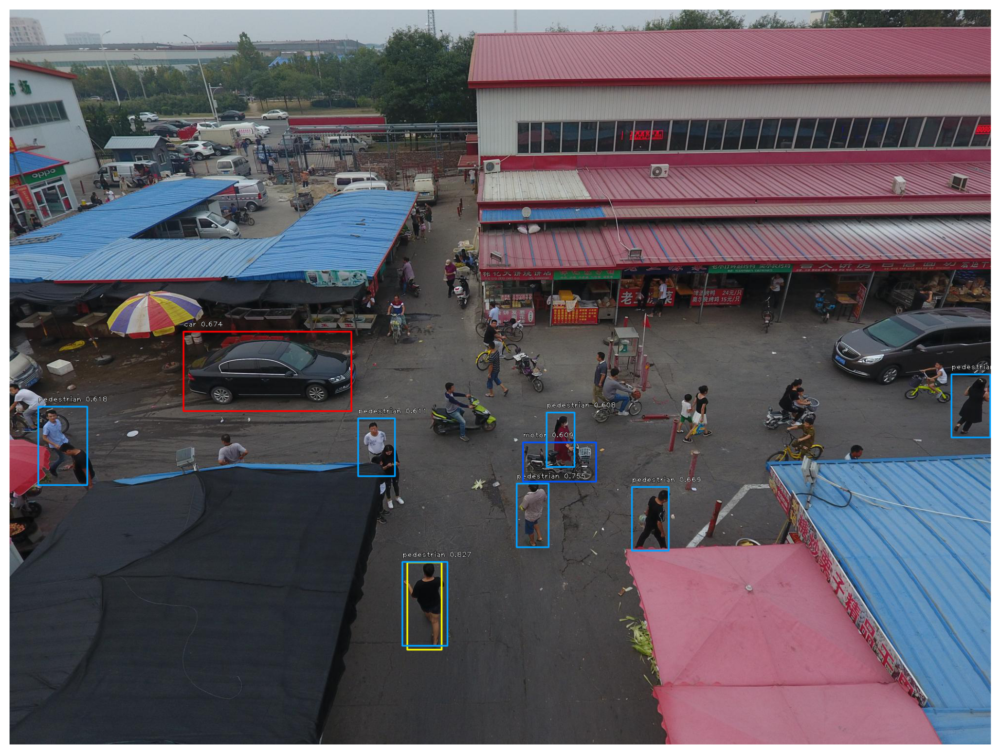

In [45]:
for i in range(df.shape[0]):
  if df.iloc[i,0].endswith("9999999_00301_d_0000133.jpg"):
    show_detected_objects(df.iloc[i],1)
    break